<a href="https://colab.research.google.com/github/HasiniSandunika/angiogram-vedio-processing/blob/master/angiogram_vedio_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
#import liblaries
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt
from skimage.filters import frangi


In [7]:
#create frames from video (preprocessing phase)
cap= cv2.VideoCapture('angiogram.mp4')
g=0
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == False:
        break
    cv2.imwrite(str(g)+'.jpg',frame[0:600, 290:990])
    g+=1
cap.release()
cv2.destroyAllWindows()
print("No.of frames:",g)

No.of frames: 504


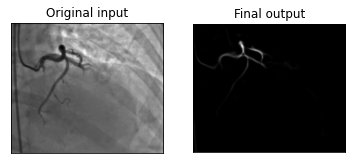

In [8]:
#describe image processing pipeline
q = cv2.imread("110.jpg",0)
a = cv2.GaussianBlur(q,(5,5),0)
a=frangi(a)[30:570, 30:670]*10000000
mask = np.zeros((a.shape[0], a.shape[1]), dtype=np.uint8)
points = np.array([[[0,0],[170,0],[170,40],[230,50],[490,200],[570,480],[490,540],[0,540]]])
cv2.fillPoly(mask, points, (255))
a = cv2.bitwise_and(a,a,mask = mask)
kernel = np.ones((5,5), np.uint8)
a = cv2.erode(a, kernel, iterations=1) 
a = cv2.GaussianBlur(a,(5,5),0)
titles = ['Original input', 'Final output']
t = [q, a]
for z in range(2):
  plt.subplot(1, 2, z + 1), plt.imshow(t[z], 'gray')
  plt.title(titles[z])
  plt.xticks([]), plt.yticks([])
plt.show()

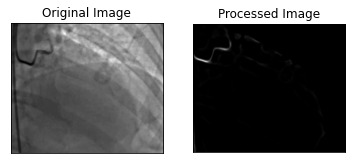

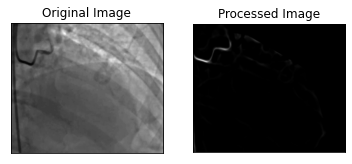

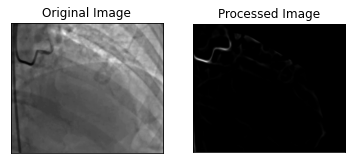

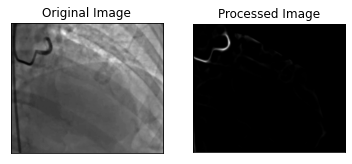

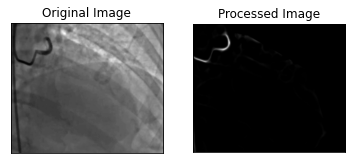

...

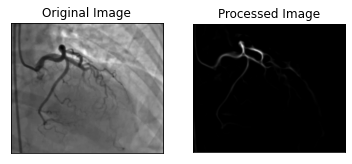

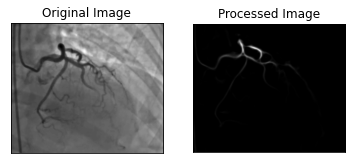

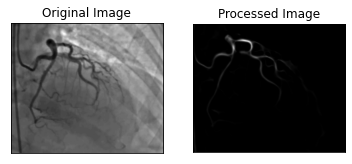

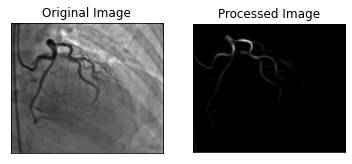

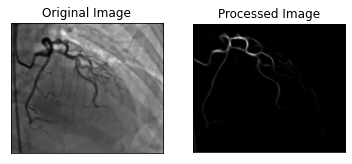

In [9]:
#IP phase
for k in range(0,504):
  img = cv2.imread(str(k)+'.jpg', 0)
  nimg = np.zeros((img.shape[0], img.shape[1]))
  img = cv2.GaussianBlur(img,(5,5),0)
  nimg=frangi(img)[30:570, 30:670]*10000000
  mask = np.zeros((nimg.shape[0], nimg.shape[1]), dtype=np.uint8)
  points = np.array([[[0,0],[170,0],[170,40],[230,50],[490,200],[570,480],[490,540],[0,540]]])
  cv2.fillPoly(mask, points, (255))
  res = cv2.bitwise_and(nimg,nimg,mask = mask)
  res = cv2.GaussianBlur(cv2.GaussianBlur(res,(5,5),0),(5,5),0)
  kernel = np.ones((5,5), np.uint8) 
  res = cv2.erode(res, kernel, iterations=1)
  titles = ['Original Image', 'Processed Image']
  images = [img, res]
  for z in range(2):
      plt.subplot(1, 2, z + 1), plt.imshow(images[z], 'gray')
      plt.title(titles[z])
      plt.xticks([]), plt.yticks([])
  plt.show()
  cv2.imwrite("ff"+str(k) + '.jpg', res)

In [10]:
#vedio creation phase
img_array = []
for filename in glob.glob('ff'+'*.jpg'):
    m = cv2.imread(filename)
    height, width, layers = m.shape
    size = (width,height)
    img_array.append(m)
out = cv2.VideoWriter('processed_video.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()